In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [33]:
img=cv2.imread("doggy.jpg",0)

In [34]:
img

array([[ 89,  88,  88, ...,  61,  61,  60],
       [ 89,  89,  88, ...,  61,  61,  60],
       [ 90,  89,  89, ...,  61,  61,  61],
       ...,
       [144, 144, 145, ..., 103, 103, 102],
       [144, 144, 147, ..., 103, 103, 102],
       [144, 145, 149, ..., 103, 103, 102]], dtype=uint8)

In [35]:
print(img.shape)

(300, 332)



Adding Noise to Image

Gaussian Noise

In [36]:
gauss_noise=np.zeros((300,332),dtype=np.uint8)
cv2.randn(gauss_noise,128,20)
gauss_noise=(gauss_noise*0.5).astype(np.uint8)

In [37]:
gn_img=cv2.add(img,gauss_noise)

Text(0.5, 1.0, 'Combined')

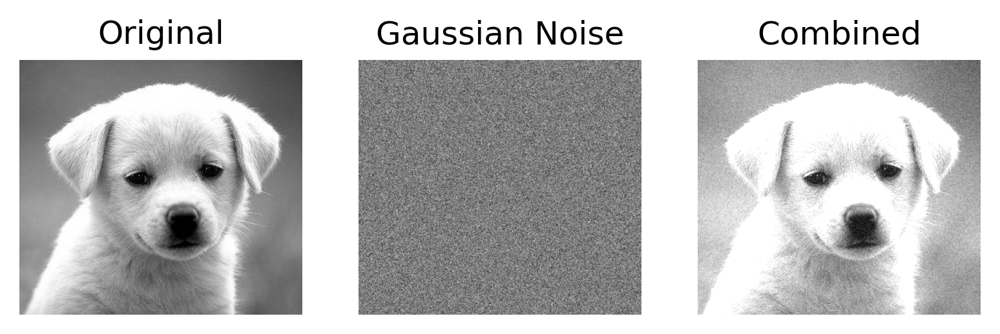

In [38]:
fig=plt.figure(dpi=300)

fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(gauss_noise,cmap='gray')
plt.axis("off")
plt.title("Gaussian Noise")

fig.add_subplot(1,3,3)
plt.imshow(gn_img,cmap='gray')
plt.axis("off")
plt.title("Combined")

In [70]:
psnr1 = cv2.PSNR(img, gn_img)

In [71]:
psnr1

13.02686619156627

Uniform Noise

In [39]:
uni_noise=np.zeros((300,332),dtype=np.uint8)
cv2.randu(uni_noise,0,255)
uni_noise=(uni_noise*0.5).astype(np.uint8)

In [40]:
un_img=cv2.add(img,uni_noise)

Text(0.5, 1.0, 'Combined')

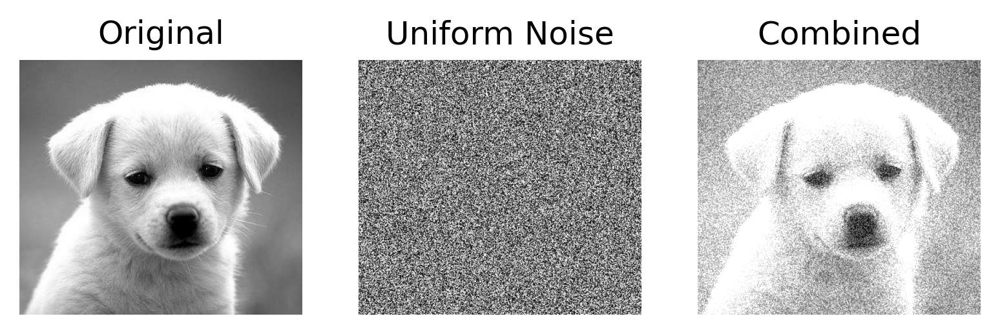

In [41]:
fig=plt.figure(dpi=300)

fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(uni_noise,cmap='gray')
plt.axis("off")
plt.title("Uniform Noise")

fig.add_subplot(1,3,3)
plt.imshow(un_img,cmap='gray')
plt.axis("off")
plt.title("Combined")

In [72]:
psnr2 = cv2.PSNR(img, un_img)

In [73]:
psnr2

12.353328085606936


Impulse Noise

In [42]:
imp_noise=np.zeros((300,332),dtype=np.uint8)
cv2.randu(imp_noise,0,255)
imp_noise=cv2.threshold(imp_noise,245,255,cv2.THRESH_BINARY)[1]

In [43]:
in_img=cv2.add(img,imp_noise)

Text(0.5, 1.0, 'Combined')

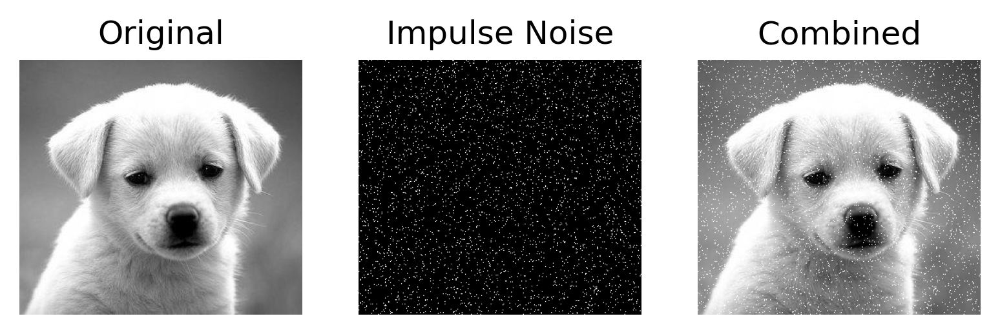

In [44]:
fig=plt.figure(dpi=300)

fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(imp_noise,cmap='gray')
plt.axis("off")
plt.title("Impulse Noise")

fig.add_subplot(1,3,3)
plt.imshow(in_img,cmap='gray')
plt.axis("off")
plt.title("Combined")

In [75]:
psnr3 = cv2.PSNR(img, in_img)

In [76]:
psnr3

21.494813821149698

Removing Noise

Using inbuilt function fastNlMeansDenoising

Text(0.5, 1.0, 'After Denoising')

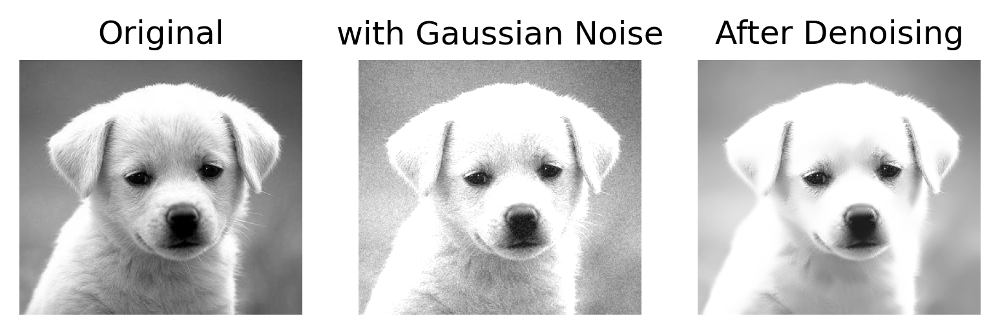

In [48]:
denoised1=cv2.fastNlMeansDenoising(gn_img,None,10,10)

fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(gn_img,cmap='gray')
plt.axis("off")
plt.title("with Gaussian Noise")

fig.add_subplot(1,3,3)
plt.imshow(denoised1,cmap='gray')
plt.axis("off")
plt.title("After Denoising")

In [78]:
psnr5=cv2.PSNR(img, denoised1)

In [79]:
psnr5

13.035157615528973

Text(0.5, 1.0, 'After Denoising')

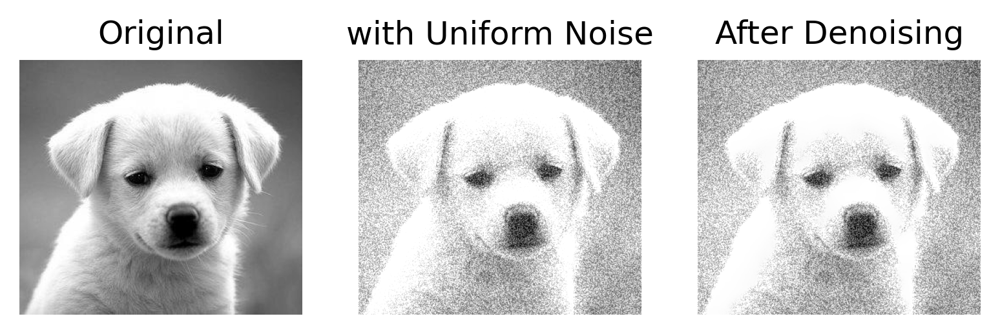

In [49]:
denoised2=cv2.fastNlMeansDenoising(un_img,None,10,10)

fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(un_img,cmap='gray')
plt.axis("off")
plt.title("with Uniform Noise")

fig.add_subplot(1,3,3)
plt.imshow(denoised2,cmap='gray')
plt.axis("off")
plt.title("After Denoising")

In [80]:
psnr6=cv2.PSNR(img, denoised2)
psnr6

12.347259441226889

Text(0.5, 1.0, 'After Denoising')

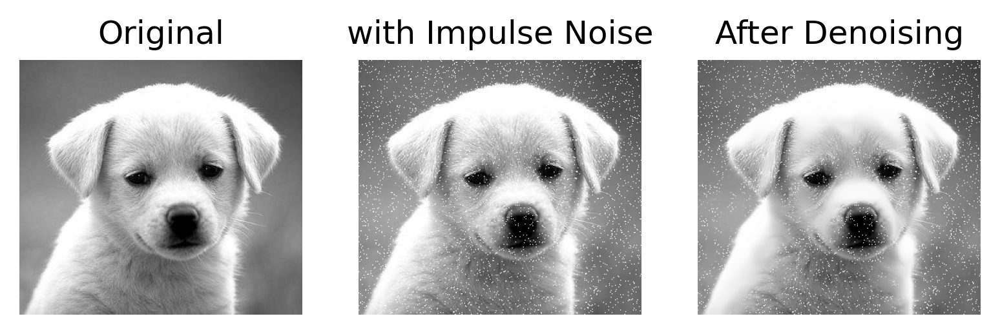

In [50]:
denoised3=cv2.fastNlMeansDenoising(in_img,None,10,10)

fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(in_img,cmap='gray')
plt.axis("off")
plt.title("with Impulse Noise")

fig.add_subplot(1,3,3)
plt.imshow(denoised3,cmap='gray')
plt.axis("off")
plt.title("After Denoising")

In [81]:
psnr7=cv2.PSNR(img, denoised3)
psnr7

21.773267173463275

Using Median Blur

In [69]:

blurred1=cv2.medianBlur(gn_img,3)
blurred2=cv2.medianBlur(un_img,3)
blurred3=cv2.medianBlur(in_img,3)


Text(0.5, 1.0, 'Median Filter')

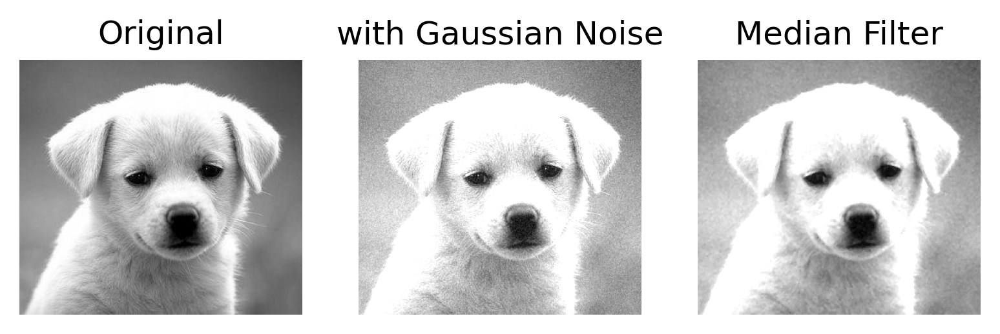

In [52]:
fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(gn_img,cmap='gray')
plt.axis("off")
plt.title("with Gaussian Noise")

fig.add_subplot(1,3,3)
plt.imshow(blurred1,cmap='gray')
plt.axis("off")
plt.title("Median Filter")

In [82]:
psnr8=cv2.PSNR(img, blurred1)
psnr8

13.004317384338453

Text(0.5, 1.0, 'Median Filter')

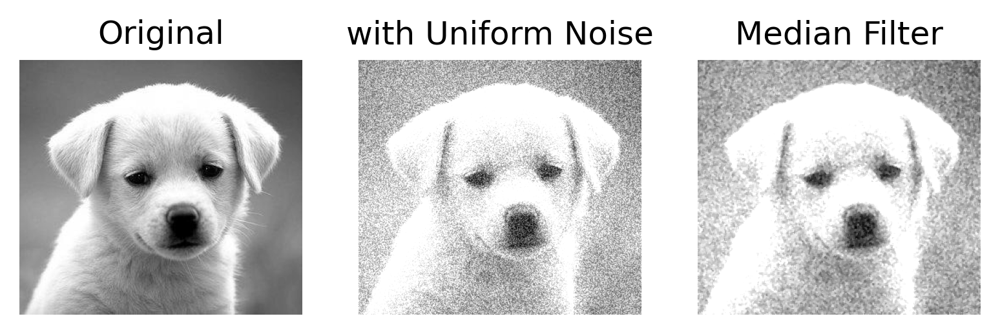

In [53]:
fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(un_img,cmap='gray')
plt.axis("off")
plt.title("with Uniform Noise")

fig.add_subplot(1,3,3)
plt.imshow(blurred2,cmap='gray')
plt.axis("off")
plt.title("Median Filter")

In [83]:
psnr9=cv2.PSNR(img, blurred2)
psnr9

12.828006408696595

Text(0.5, 1.0, 'Median Filter')

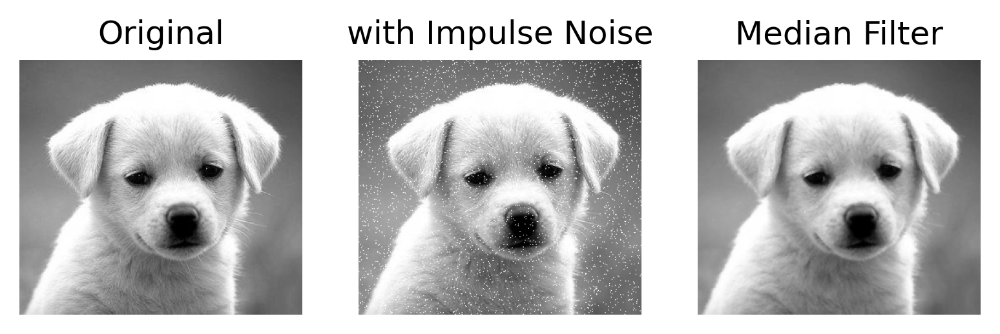

In [54]:
fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(in_img,cmap='gray')
plt.axis("off")
plt.title("with Impulse Noise")

fig.add_subplot(1,3,3)
plt.imshow(blurred3,cmap='gray')
plt.axis("off")
plt.title("Median Filter")

In [84]:
psnr10=cv2.PSNR(img, blurred3)
psnr10

32.094439023124934

Gaussian Blur

In [55]:
blurred21=cv2.GaussianBlur(gn_img,(3,3),0)
blurred22=cv2.GaussianBlur(un_img,(3,3),0)
blurred23=cv2.GaussianBlur(in_img,(3,3),0)

Text(0.5, 1.0, 'Gaussian Filter')

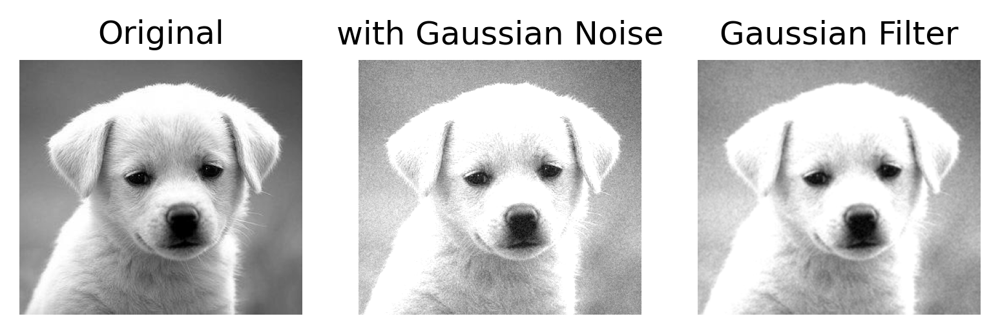

In [56]:
fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(gn_img,cmap='gray')
plt.axis("off")
plt.title("with Gaussian Noise")

fig.add_subplot(1,3,3)
plt.imshow(blurred21,cmap='gray')
plt.axis("off")
plt.title("Gaussian Filter")

In [85]:
psnr11=cv2.PSNR(img, blurred21)
psnr11

13.073342474197426

Text(0.5, 1.0, 'Gaussian Filter')

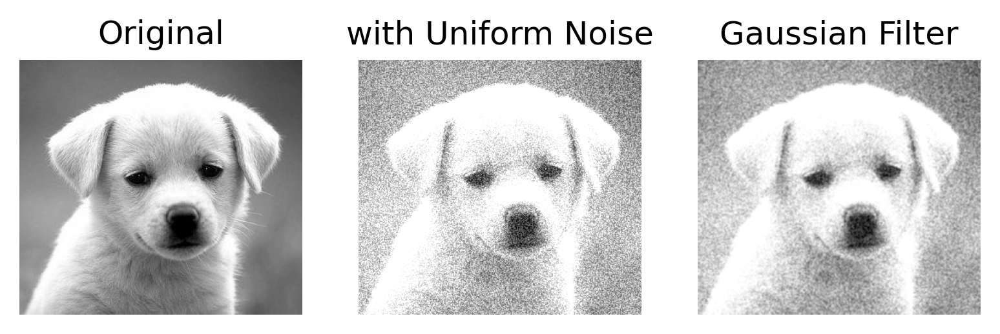

In [57]:
fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(un_img,cmap='gray')
plt.axis("off")
plt.title("with Uniform Noise")

fig.add_subplot(1,3,3)
plt.imshow(blurred22,cmap='gray')
plt.axis("off")
plt.title("Gaussian Filter")

In [86]:
psnr12=cv2.PSNR(img, blurred22)
psnr12

13.292153653025672

Text(0.5, 1.0, 'Gaussian Filter')

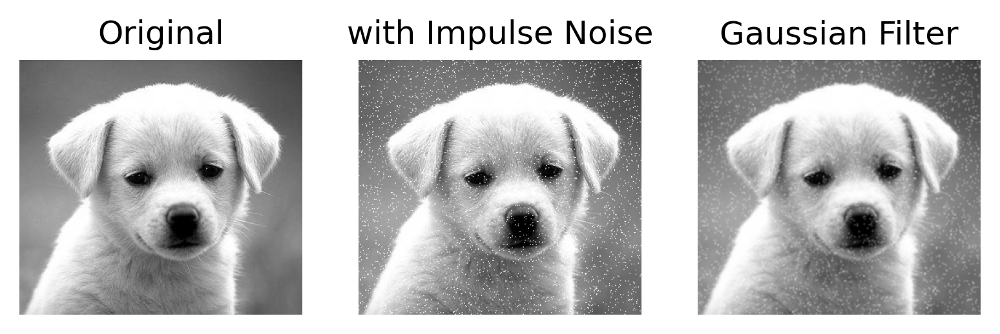

In [58]:
fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(in_img,cmap='gray')
plt.axis("off")
plt.title("with Impulse Noise")

fig.add_subplot(1,3,3)
plt.imshow(blurred23,cmap='gray')
plt.axis("off")
plt.title("Gaussian Filter")

In [87]:
psnr13=cv2.PSNR(img, blurred23)
psnr13

27.88466579352315

**Color Image**

In [88]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [134]:
img1=cv2.imread("flower.jpg")

In [175]:
img1=  cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

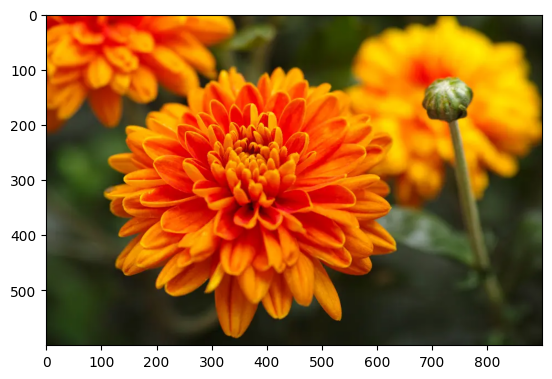

In [176]:
plt.imshow(img1)

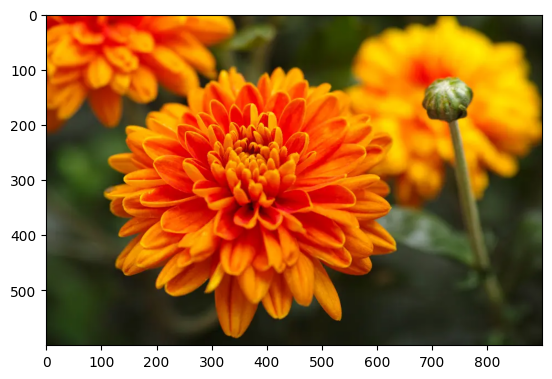

In [177]:
plt.imshow(img1)

In [178]:
img1

array([[[201,  54,   0],
        [201,  54,   0],
        [201,  54,   0],
        ...,
        [ 68,  81,  58],
        [ 68,  81,  58],
        [ 68,  81,  58]],

       [[203,  52,   0],
        [203,  52,   0],
        [203,  52,   0],
        ...,
        [ 68,  81,  58],
        [ 68,  81,  58],
        [ 68,  81,  58]],

       [[203,  50,   0],
        [203,  50,   0],
        [203,  50,   0],
        ...,
        [ 68,  81,  58],
        [ 68,  81,  58],
        [ 68,  81,  58]],

       ...,

       [[ 19,  24,   9],
        [ 19,  24,   9],
        [ 19,  24,   9],
        ...,
        [ 17,  19,  11],
        [ 16,  17,  10],
        [ 16,  17,  10]],

       [[ 19,  24,   9],
        [ 19,  24,   9],
        [ 19,  24,   9],
        ...,
        [ 17,  19,  11],
        [ 16,  17,  10],
        [ 16,  17,  10]],

       [[ 19,  24,   9],
        [ 19,  24,   9],
        [ 19,  24,   9],
        ...,
        [ 16,  17,  10],
        [ 15,  16,   9],
        [ 15,  16,   9]]

In [179]:
print(img1.shape)

(600, 900, 3)


Adding Noise to the image 

Gaussian Noise

In [180]:
gauss_noise=np.zeros((600,900,3),dtype=np.uint8)
cv2.randn(gauss_noise,128,20)
gauss_noise=(gauss_noise*0.5).astype(np.uint8)

In [181]:
gn_img1=cv2.add(img1,gauss_noise)

Text(0.5, 1.0, 'Combined')

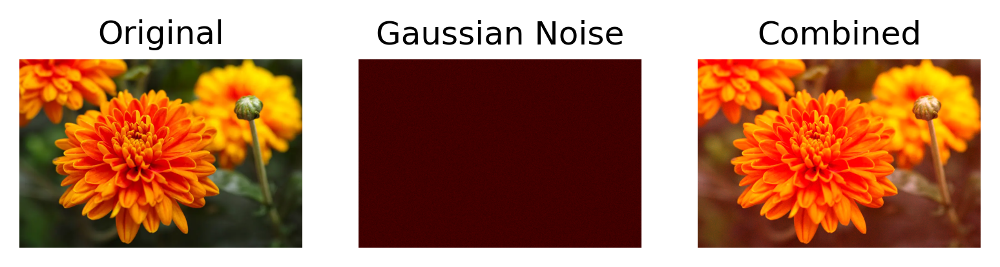

In [182]:
fig=plt.figure(dpi=300)

fig.add_subplot(1,3,1)
plt.imshow(img1)
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(gauss_noise)
plt.axis("off")
plt.title("Gaussian Noise")

fig.add_subplot(1,3,3)
plt.imshow(gn_img1)
plt.axis("off")
plt.title("Combined")

In [183]:
psnr14 = cv2.PSNR(img1, gn_img1)
psnr14

18.962664957900973

Uniform Noise

In [184]:
uni_noise=np.zeros((600,900,3),dtype=np.uint8)
cv2.randu(uni_noise,0,255)
uni_noise=(uni_noise*0.5).astype(np.uint8)

In [185]:
un_img1=cv2.add(img1,uni_noise)

Text(0.5, 1.0, 'Combined')

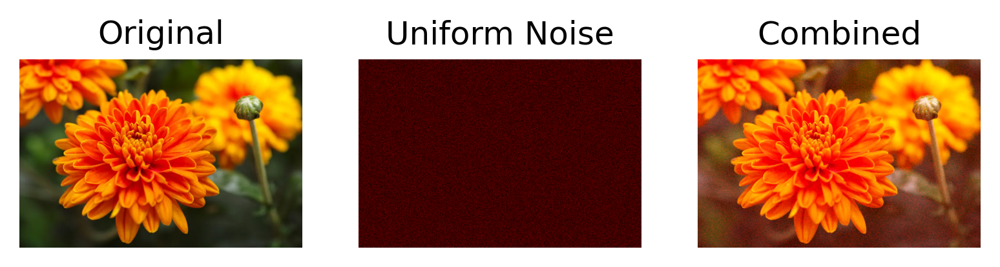

In [186]:
fig=plt.figure(dpi=300)

fig.add_subplot(1,3,1)
plt.imshow(img1)
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(uni_noise)
plt.axis("off")
plt.title("Uniform Noise")

fig.add_subplot(1,3,3)
plt.imshow(un_img1)
plt.axis("off")
plt.title("Combined")

In [187]:
psnr15 = cv2.PSNR(img1, un_img1)
psnr15

18.207549439380827

Impulse Noise

In [188]:
imp_noise=np.zeros((600,900,3),dtype=np.uint8)
cv2.randu(imp_noise,0,255)
imp_noise=cv2.threshold(imp_noise,245,255,cv2.THRESH_BINARY)[1]

In [189]:
in_img1=cv2.add(img1,imp_noise)

Text(0.5, 1.0, 'Combined')

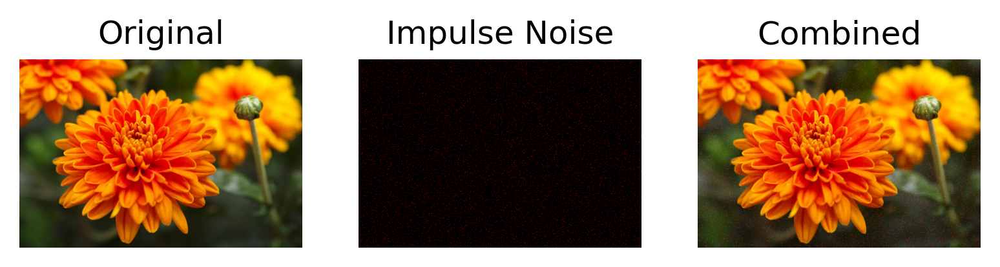

In [190]:
fig=plt.figure(dpi=300)

fig.add_subplot(1,3,1)
plt.imshow(img1)
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(imp_noise)
plt.axis("off")
plt.title("Impulse Noise")

fig.add_subplot(1,3,3)
plt.imshow(in_img1)
plt.axis("off")
plt.title("Combined")

In [191]:
psnr15 = cv2.PSNR(img1, in_img1)
psnr15

24.520981182389665

Removing Noise



Text(0.5, 1.0, 'After Denoising')

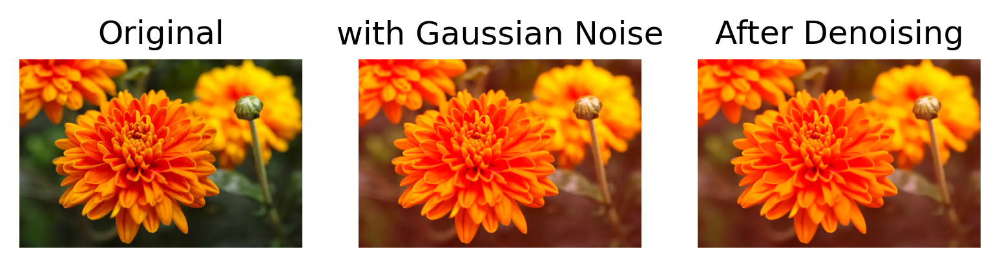

In [192]:
denoised11=cv2.fastNlMeansDenoising(gn_img1,None,10,10)

fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img1)
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(gn_img1)
plt.axis("off")
plt.title("with Gaussian Noise")

fig.add_subplot(1,3,3)
plt.imshow(denoised11)
plt.axis("off")
plt.title("After Denoising")

In [193]:
psnr16=cv2.PSNR(img1, denoised11)
psnr16

19.00018911714815

Text(0.5, 1.0, 'After Denoising')

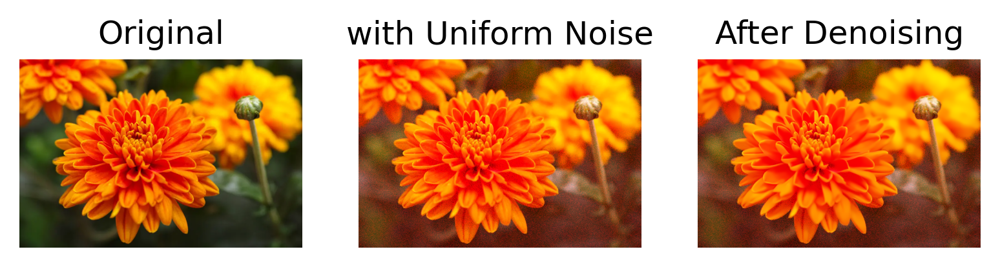

In [194]:
denoised22=cv2.fastNlMeansDenoising(un_img1,None,10,10)

fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img1)
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(un_img1)
plt.axis("off")
plt.title("with Uniform Noise")

fig.add_subplot(1,3,3)
plt.imshow(denoised22)
plt.axis("off")
plt.title("After Denoising")

In [195]:
psnr17=cv2.PSNR(img1, denoised22)
psnr17

18.236505658381684

Text(0.5, 1.0, 'After Denoising')

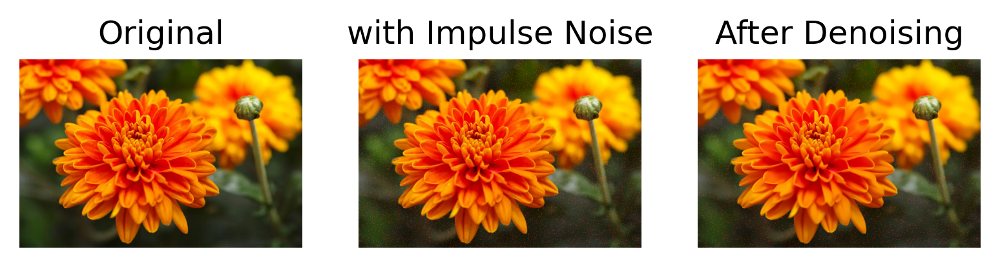

In [196]:
denoised33=cv2.fastNlMeansDenoising(in_img1,None,10,10)

fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img1)
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(in_img1)
plt.axis("off")
plt.title("with Impulse Noise")

fig.add_subplot(1,3,3)
plt.imshow(denoised33)
plt.axis("off")
plt.title("After Denoising")

In [197]:
psnr18=cv2.PSNR(img1, denoised33)
psnr18

25.301716042593313

Blur Filter

In [198]:

blurred10=cv2.medianBlur(gn_img1,3)
blurred20=cv2.medianBlur(un_img1,3)
blurred30=cv2.medianBlur(in_img1,3)


Text(0.5, 1.0, 'Median Filter')

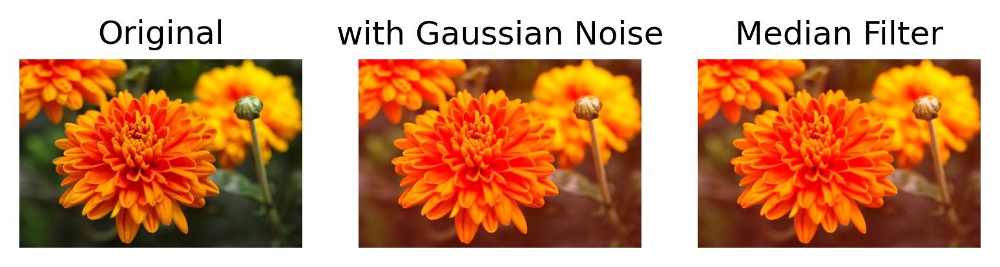

In [199]:
fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img1)
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(gn_img1)
plt.axis("off")
plt.title("with Gaussian Noise")

fig.add_subplot(1,3,3)
plt.imshow(blurred10)
plt.axis("off")
plt.title("Median Filter")

In [200]:
psnr19=cv2.PSNR(img1, blurred10)
psnr19

18.99042249568126

Text(0.5, 1.0, 'Median Filter')

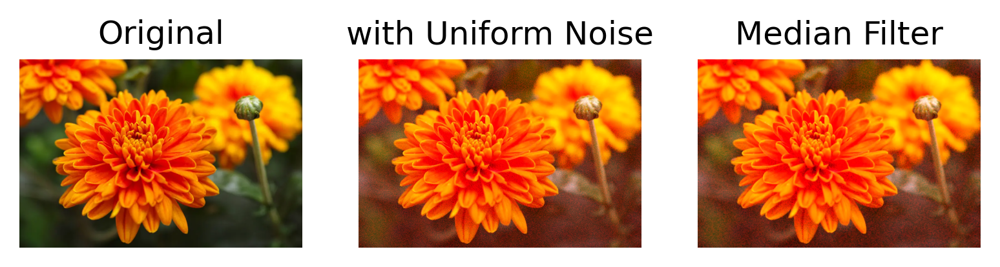

In [201]:
fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img1)
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(un_img1)
plt.axis("off")
plt.title("with Uniform Noise")

fig.add_subplot(1,3,3)
plt.imshow(blurred20)
plt.axis("off")
plt.title("Median Filter")

In [202]:
psnr20=cv2.PSNR(img1, blurred20)
psnr20

18.78554730286237

Text(0.5, 1.0, 'Median Filter')

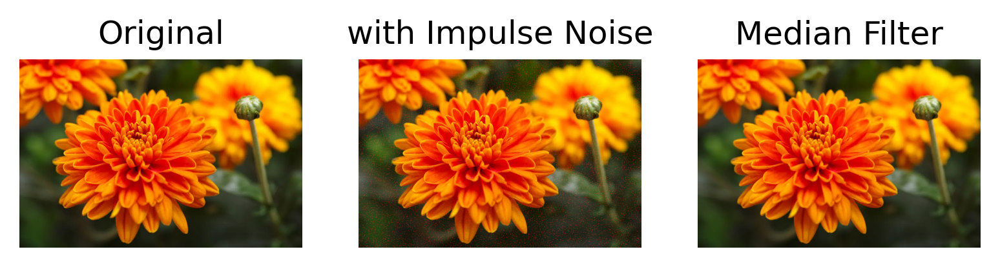

In [203]:
fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img1)
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(in_img1)
plt.axis("off")
plt.title("with Impulse Noise")

fig.add_subplot(1,3,3)
plt.imshow(blurred30)
plt.axis("off")
plt.title("Median Filter")

In [204]:
psnr21=cv2.PSNR(img1, blurred30)
psnr21

42.959899977767776

In [205]:
blurred210=cv2.GaussianBlur(gn_img1,(3,3),0)
blurred220=cv2.GaussianBlur(un_img1,(3,3),0)
blurred230=cv2.GaussianBlur(in_img1,(3,3),0)

Text(0.5, 1.0, 'Gaussian Filter')

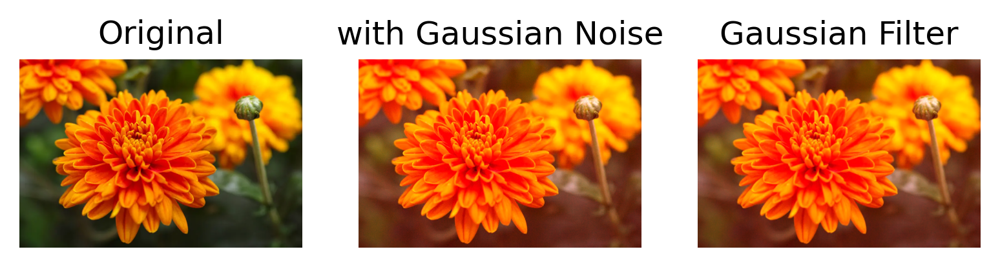

In [206]:
fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img1)
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(gn_img1)
plt.axis("off")
plt.title("with Gaussian Noise")

fig.add_subplot(1,3,3)
plt.imshow(blurred210)
plt.axis("off")
plt.title("Gaussian Filter")

In [207]:
psnr22=cv2.PSNR(img1, blurred210)
psnr22

19.020146538003438

Text(0.5, 1.0, 'Gaussian Filter')

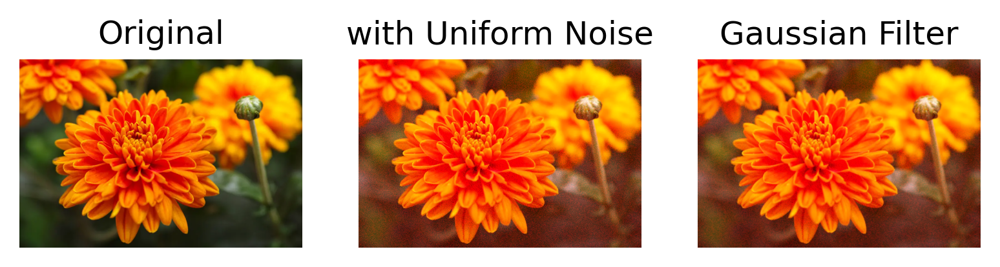

In [208]:
fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img1)
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(un_img1)
plt.axis("off")
plt.title("with Uniform Noise")

fig.add_subplot(1,3,3)
plt.imshow(blurred220)
plt.axis("off")
plt.title("Gaussian Filter")

In [209]:
psnr23=cv2.PSNR(img1, blurred220)
psnr23

19.167404850538965

Text(0.5, 1.0, 'Gaussian Filter')

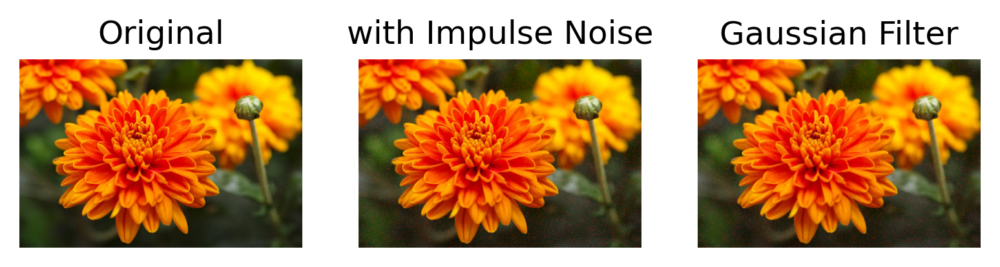

In [210]:
fig=plt.figure(dpi=300)
fig.add_subplot(1,3,1)
plt.imshow(img1)
plt.axis("off")
plt.title("Original")

fig.add_subplot(1,3,2)
plt.imshow(in_img1)
plt.axis("off")
plt.title("with Impulse Noise")

fig.add_subplot(1,3,3)
plt.imshow(blurred230)
plt.axis("off")
plt.title("Gaussian Filter")

In [211]:
psnr24=cv2.PSNR(img1, blurred230)
psnr24

31.77887457376076